# シグナルありデータ生成

In [1]:
DEBUG = True
#DEBUG = False

#IS_ISO = True
IS_ISO = False

OUTDIR = "/volume/kaggle/g2net2/pyfstat_output/tmp_signal"
#OUTDIR = "/volume/kaggle/g2net2/pyfstat_output/ex005_generating_signal_gap"
IS_DEL_OUTDIR = True

#TMP_OUTDIR = "my_generating_signal"
TMP_OUTDIR = "/volume/kaggle/g2net2/pyfstat_output/PyFstat_tmp_files/my_generating_signal"

GAP_N_LEN = 50

In [2]:
# Parameters
TMP_OUTDIR = "/volume/kaggle/g2net2/pyfstat_output/PyFstat_tmp_files/my_generating_signal_1"
OUTDIR = "/volume/kaggle/g2net2/pyfstat_output/ex005_generating_signal_gap_1"
GAP_N_LEN = 100
IS_ISO = False
IS_DEL_OUTDIR = True
DEBUG = False


In [3]:
#!pip install h5py
#!pip install pandas
import h5py
import pandas as pd

In [4]:
import os
import glob
import shutil
import numpy as np
from tqdm.notebook import tqdm
from scipy import stats
import matplotlib.pyplot as plt

import pyfstat
from pyfstat.utils import get_sft_as_arrays

# Local module to simplify plotting
import tutorial_utils

logger = pyfstat.set_up_logger(label=TMP_OUTDIR, log_level="INFO")

%matplotlib inline

22-11-27 04:02:30.158 pyfstat INFO    : Running PyFstat version 1.18.1+84.5ded4a67.clean
22-11-27 04:02:30.233 pyfstat.utils.importing INFO    : No $DISPLAY environment variable found, so importing matplotlib.pyplot with non-interactive 'Agg' backend.


In [5]:
# ================================================
# power画像にして保存
# ================================================
def show_1img_2ch(p_h1, p_l1, ts_h1, ts_l1, f, y, is_show=False, save_path="", figsize=(18, 5)):
    
    #p_h1, p_l1 = p_h1 * 255, p_l1 * 255
    
    plt.figure(figsize=figsize)

    #print(p_h1.max(), p_l1.max())
    #print(ts_h1, ts_l1, f.max(), f.min())
    
    if figsize[0] > figsize[1]:
        plt.subplot(2, 1, 1)
    else:
        plt.subplot(1, 2, 1)
    plt.title(f'H1 Spectrogram y:{y}')
    plt.xlabel('time')
    plt.ylabel('frequency')
    plt.imshow(p_h1)  # , extent=[ts_h1.min(), ts_l1.max(), f.max(), f.min()]
    plt.colorbar()

    if figsize[0] > figsize[1]:
        plt.subplot(2, 1, 2)
    else:
        plt.subplot(1, 2, 2)
    plt.title(f'L1 Spectrogram y:{y}')
    plt.xlabel('time')
    plt.ylabel('frequency')
    plt.imshow(p_l1)
    plt.colorbar()

    if save_path != "":
        plt.savefig(save_path, bbox_inches='tight', pad_inches=0)
    
    if is_show:
        plt.tight_layout()
        plt.show()
    plt.clf()  # メモリ解放
    plt.close()


def get_hdf5(h_path, y, 
             is_p_mean=True,
             is_show=True, 
             save_dir="", 
             f_coff=2.9e-21):
    file_id = Path(h_path).stem
    with h5py.File(h_path, 'r') as f:
        g = f[file_id]
        
        f = g['frequency_Hz'][:]  # Dataset型なので[:]付けたらnpになる
        
        ts_h1 = g["H1"]['timestamps_GPS'][:]  # Dataset型なので[:]付けたらnpになる
        ts_l1 = g["L1"]['timestamps_GPS'][:]  # Dataset型なので[:]付けたらnpになる
        #ts_h1 = [ts2time(ts) for ts in ts_h1]
        #ts_l1 = [ts2time(ts) for ts in ts_l1]
        
        a_h1 = g["H1"]['SFTs'][:]  # Dataset型なので[:]付けたらnpになる
        a_l1 = g["L1"]['SFTs'][:]  # Dataset型なので[:]付けたらnpになる
        
        a_h1_norm = a_h1 / f_coff
        p_h1 = a_h1_norm.real**2 + a_h1_norm.imag**2
        #p_h1 /= np.mean(p_h1)  # normalize
        
        a_l1_norm = a_l1 / f_coff
        p_l1 = a_l1_norm.real**2 + a_l1_norm.imag**2
        #p_l1 /= np.mean(p_l1)  # normalize
        
        if is_p_mean:
            # パワースペクトルはtimestepsごとに平均化. compress 4096 -> 128
            p_h1 = p_h1[:, :4096]
            p_l1 = p_l1[:, :4096]
            p_h1 = np.mean(p_h1.reshape(360, 128, 4096//128), axis=2)
            p_l1 = np.mean(p_l1.reshape(360, 128, 4096//128), axis=2)
            figsize = (10, 10)
        else:
            figsize = (18, 5)
        
        if is_show or save_dir != "":
            show_1img_2ch(p_h1, p_l1, ts_h1, ts_l1, f, y, is_show,
                          save_path=f"{save_dir}/{Path(h_path).stem}_{str(y)}.png", 
                          figsize=figsize,
                         )
        
        return file_id, f, ts_h1, ts_l1, a_h1, a_l1, p_h1, p_l1

In [6]:
# ================================================
# 生成したhdf5ファイルロードできるか確認
# ================================================
import h5py
from pathlib import Path

def load_hdf5(h_path):
    """hdf5ファイルロード"""
    with h5py.File(h_path, 'r') as f:
        g = f[file_id]

        # [:]を最後につけないと取り出せないので注意
        freq = g['frequency_Hz'][:]  # shape: (360,) 各振動数

        h1_a = g["H1"]['SFTs'][:]
        h1_t = g["H1"]['timestamps_GPS'][:]

        l1_a = g["L1"]['SFTs'][:]
        l1_t = g["L1"]['timestamps_GPS'][:]
    
    return freq, h1_a, l1_a, h1_t, l1_t

# gen_gap_noise_signal

In [7]:
def gen_gap_noise_signal_detectors(out_path, file_id, sqrtSX, F0, prob_gap, detectors, tref, signal_parameters, 
                                  tmp_out_dir=TMP_OUTDIR):
    """detectors指定してgapノイズ+シグナルデータを生成
    gapノイズ(timestamps)は非定常の duration, tstart と併用できなかった
    """
    
    # Setup Writer
    writer_kwargs = {
        "outdir": tmp_out_dir,
        "detectors": detectors,  # シミュレーションする検出器(ここではLIGOハンフォード)
        "Tsft": 1800,  # フーリエ変換の継続時間
        "SFTWindowType": "tukey",  # 短時間フーリエ変換を計算するための窓関数
        "SFTWindowBeta": 0.01,  # 窓関数に関連するパラメータ。0.01, 0.001 どちらでも変わらんらしい(https://www.kaggle.com/competitions/g2net-detecting-continuous-gravitational-waves/discussion/347052#2003112
        "sqrtSX": sqrtSX,  # 雑音の片側振幅スペクトル密度
        # コンペデータの振動数の範囲内でバンドの中心周波数ランダムに変える
        "F0": F0,  # 生成するバンドの中心周波数 [Hz]. [F0 - Band/2, F0 + Band/2]
        "Band": 0.5,  # F0付近の周波数帯域幅 [Hz]
    }
    
    # =================================================
    # 中間ファイル作られるから実行前にきれいにする
    # =================================================
    if os.path.exists(TMP_OUTDIR):
        shutil.rmtree(TMP_OUTDIR)
        os.mkdir(TMP_OUTDIR)
    
    # =================================================
    # 各 GPS タイムスタンプのリスト。リストの要素間の飛びの時間はデータが存在しない「ギャップ」になる
    # =================================================
    max_gap_sec = (4*30 - 81) * 24 * 3600  # 取り得るgapの全時間sec。test setのデータある観測時間の最小は81日間
    #min_gap_sec = (4*30 - 101) * 24 * 3600  # 取り得るgapの全時間sec。test setのデータある観測時間の最大は101日間
    Tstart = tref  # 観測開始時刻 [GPS時刻]
    gap_sum = 0
    timestamps = [Tstart]
    if detectors == "H1":
        # h1のタイムスタンプの数
        n_idxs = np.random.randint(4281, 4887+1)  # test setのタイムスタンプの数より
    else:
        # l1のタイムスタンプの数
        n_idxs = np.random.randint(4297, 4878+1)  # test setのタイムスタンプの数より
    #for idx in range(5760): # 5760(=4*30*24*3600/1800)タイムスタンプの最大長さ
    for idx in range(n_idxs):
        # prob_gapの確率でgap入れる
        if ( np.random.rand() > 1 - prob_gap ) and ( gap_sum+1 < max_gap_sec ):
            # 最低1秒gapありとした
            # https://www.kaggle.com/competitions/g2net-detecting-continuous-gravitational-waves/discussion/358835#2026499
            inteval = np.random.randint(1, 105026+1)  # test setのgapの最大は105026sec
            gap_sum += inteval
        else:
            inteval = 1800
        timestamps += [timestamps[-1] + inteval]
    #print("timestamps:", list( np.array(timestamps[1:])-np.array(timestamps[:-1]) ))
    writer_kwargs["timestamps"] = np.array(timestamps)
    
    # =================================================
    # ノイズデータ生成
    # =================================================
    # Create SFTs
    writer = pyfstat.Writer(**writer_kwargs)
    writer.make_data()
    
    # =======================================================================
    # シグナルデータ生成
    # =======================================================================
    signal_parameters["outdir"] = writer_kwargs["outdir"]
    signal_parameters["noiseSFTs"] = writer.sftfilepath
    signal_parameters["label"] = "signal"
    for key in ["SFTWindowType", "SFTWindowBeta"]:
        signal_parameters[key] = writer_kwargs[key]
    writer = pyfstat.Writer(**signal_parameters)
    writer.make_data()
    
    # SNRは、特定のパラメータセットに対するSFTのセットから、以下のように計算することができます。
    snr = pyfstat.SignalToNoiseRatio.from_sfts(
        F0=writer.F0, sftfilepath=writer.sftfilepath
    )
    squared_snr = snr.compute_snr2(
        Alpha=writer.Alpha, 
        Delta=writer.Delta,
        psi=writer.psi,
        phi=writer.phi, 
        h0=writer.h0,
        cosi=writer.cosi
    )
    snr_value = np.sqrt(squared_snr)
    
    # SFTデータをnumpyの配列に読み込み
    frequency, timestamps, fourier_data = get_sft_as_arrays(writer.sftfilepath)
    
    return frequency, timestamps, fourier_data, snr_value


def gen_gap_noise_signal(file_id, F0, sqrtSX, 
                         prob_gap=0.01, 
                         out_path="", 
                         F1=1e-8, 
                         h0_div_ratio=10,
                         is_isotropic_amplitude=False,
                         min_max_F0_r=[0.02, 0.18],
                         min_max_Alpha=[0, 2.0*np.pi],
                         min_max_Delta=[-0.5*np.pi, 0.5*np.pi],
                         min_max_cosi=[-1, 1],
                         min_max_psi=[-0.25*np.pi, 0.25*np.pi],
                         min_max_phi=[0, 2*np.pi],
                        ):
    """gapノイズ+シグナルデータを生成してhdf5に保存する
    gapノイズ(timestamps)は非定常の duration, tstart と併用できなかった
    """
    # =======================================================================
    # シグナルデータの引数用意
    # =======================================================================
    # https://www.kaggle.com/code/anonamename/g2net2-generate-cw
    # https://www.kaggle.com/code/anonamename/g2net2-simple-pyfstat
    # https://www.kaggle.com/competitions/g2net-detecting-continuous-gravitational-waves/discussion/361562#2001689
    # https://www.kaggle.com/competitions/g2net-detecting-continuous-gravitational-waves/discussion/361562#2000275
    
    # ==== Continuous gravitational-wave signal (CW)　のパラメに関するメモ ====
    # 標準的なCW信号は、ドップラー変調パラメータ と 振幅パラメータ の2つのパラメータセットでパラメータ化できる
    # - ドップラー変調パラメータは、信号の周波数が太陽系内の地球の動きによってどう変わるかをコード化する
    # - 振幅パラメータは、信号源の中性子星に依存するCWの全体的な振幅を記述する
    
    # ドップラー変調パラメータ
    # - F0: 重力波の中心周波数。この周波数を中心に重力波発生する
    # - F1: 線形スピンダウンパラメータ。重力波の周波数の一次導関数 (時間の経過に伴う変化)。ソース (中性子星) は GW を放出するため、時間の経過とともにエネルギーを失う。このためF1は負の数になる。妥当な範囲は [-1e-9, 0] Hz
    # - Alpha 中性子星の位置に対する赤緯（赤道座標における緯度。赤道から北はプラス、南はマイナスの符号をつけて表す） : [-pi/2, pi/2]
    # - Delta 中性子星の位置に対する赤道座標の偏角 : [-pi/2, pi/2]
    
    # 振幅パラメータ
    # - h0 CW信号の平均振幅 : h0はノイズの振幅よりも 1～2 桁小さい。テストセットに使用されたものと同様の分布を持つ独自の信号を作成する必要あり
    #   振幅パラメータの以下は、検出器に対する ソース の相対的な方向を決めるパラメ
    #   - cosi 中性子星と私たちの間の傾斜角のコサイン : [-1, 1]
    #   - psi（プサイψ）CW信号の偏光角 : [-pi/4, pi/4] (これは周期的であるため、それを超えるものはすべてこの範囲に折り返されます)
    #   - phi（ファイφ）CW信号の初期位相 : [0, 2*pi]
    
    # 「弱い」信号は信号対雑音比（SNR）ρ が 低く、感度の深さ(sensitivity depth) D = sqrtSX(ノイズの振幅) / h0 が高い
    # 現在の未知天体からのCW信号の探索は、感度の深さ D = 10 ~ 50 
    # ただし D > 20 はシグナルが見えなくなる
    
    # ==== 本コンペでは無意味なパラメ ====
    # - F2: 0。重力波の本質的な進化を説明する別の用語。このコンペティションでは周波数とスピンダウンのみに焦点を当てているため、0 に設定
    # - tp, asini, period。連星系の中性子星を記述するために使用されるパラメーターであり、信号の周波数進化に影響を与えます。この大会ではそれらを安全に無視できます (ただし、必要に応じて自由に遊んでください!)。

    _f0_r = np.random.uniform(min_max_F0_r[0], min_max_F0_r[1])
    _psi = np.random.uniform(min_max_psi[0], min_max_psi[1])
    if is_isotropic_amplitude:
        # https://www.kaggle.com/code/anonamename/g2net2-generate-cw
        # 等方的に配向した中性子星の母集団をサンプリング(Alpha, Delta, cosi, psi, phi省略可)
        signal_parameters_generator = pyfstat.AllSkyInjectionParametersGenerator(
            priors={
                "tref": 1238166018,
                "F0": lambda: F0 + _f0_r,
                "F1": F1,
                "F2": 0,
                "h0": lambda: sqrtSX / h0_div_ratio,
                "psi": _psi, #  (-pi/4, pi/4)
                **pyfstat.injection_parameters.isotropic_amplitude_priors,
            },
        )
        signal_parameters = signal_parameters_generator.draw()
    else:
        _Alpha = np.random.uniform(min_max_Alpha[0], min_max_Alpha[1])
        _Delta = np.random.uniform(min_max_Delta[0], min_max_Delta[1])
        _cosi = np.random.uniform(min_max_cosi[0], min_max_cosi[1])
        _phi = np.random.uniform(min_max_phi[0], min_max_phi[1])
        signal_parameters = {
            "tref": 1238166018,
            "F0": F0 + _f0_r,
            "F1": F1,  # 10**stats.uniform(-12, 4).rvs(),  # [-1e-9,0]
            "F2": 0,  
            "h0": sqrtSX / h0_div_ratio,
            "Alpha": _Alpha,  # (0,2pi)
            "Delta": _Delta,  # [-pi/2,pi/2]
            "cosi": _cosi, #(-1,1)  Affects signal strength
            "psi": _psi, #  (-pi/4, pi/4)
            "phi": _phi,  # (0,2pi)
        }
        
    #print("signal_parameters:", signal_parameters)
    #print("signal_parameters:", signal_parameters)
    #f = h  # わざとエラー出す
    
    # h1とl1で異なるgapにするためにそれぞれでデータ生成
    frequency, timestamps_h1, fourier_data_h1, snr_value_h1 = gen_gap_noise_signal_detectors(out_path, file_id, sqrtSX, 
                                                                                             F0, prob_gap, "H1", 
                                                                                             signal_parameters["tref"],
                                                                                             signal_parameters)
    frequency, timestamps_l1, fourier_data_l1, snr_value_l1 = gen_gap_noise_signal_detectors(out_path, file_id, sqrtSX, 
                                                                                             F0, prob_gap, "L1", 
                                                                                             signal_parameters["tref"],
                                                                                             signal_parameters)
    
    # =================================================
    # 対象の周波数帯域の 0.2 の範囲だけスライス
    # =================================================
    # https://www.kaggle.com/competitions/g2net-detecting-continuous-gravitational-waves/discussion/347052#1987496
    first_index = np.argmin( np.abs( frequency - F0 ) )
    last_index = np.argmin( np.abs( frequency - (F0 + 0.2) ) )
    frequency = frequency[first_index:last_index+1]
    h1_amp = fourier_data_h1["H1"][first_index:last_index + 1, :]
    l1_amp = fourier_data_l1["L1"][first_index:last_index + 1, :]
    
    # 360の長さまでにしておく（361になるときがあるので）
    frequency = frequency[:360]
    h1_amp = h1_amp[:360,:]
    l1_amp = l1_amp[:360,:]
    
    # =================================================
    # HDF5ファイルの作成
    # =================================================
    if out_path != "":
        with h5py.File(f"{out_path}", "w") as h5:
            g = h5.create_group(str(file_id))
            g.create_dataset('frequency_Hz', data=frequency)

            g_h = g.create_group("H1")
            g_h.create_dataset('SFTs', data=h1_amp)
            g_h.create_dataset('timestamps_GPS', data=timestamps_h1["H1"])

            g_l = g.create_group("L1")
            g_l.create_dataset('SFTs', data=l1_amp)
            g_l.create_dataset('timestamps_GPS', data=timestamps_l1["L1"])
    
    return frequency, timestamps_h1["H1"], timestamps_l1["L1"], h1_amp, l1_amp, snr_value_h1, snr_value_l1

In [8]:
debug = False
#debug = True
if debug:
    frequency, h1_ts, l1_ts, h1_amp, l1_amp, h1_snr, l1_snr = gen_gap_noise_signal("tmp", 150, 1e-23, prob_gap=0.01, 
                                                                                   out_path=f"./tmp/tmp.hdf5", 
                                                                                   F1=1e-10,
                                                                                   h0_div_ratio=2,
                                                                                   is_isotropic_amplitude=True,
                                                                                   min_max_F0_r=[0.02, 0.18],
                                                                                  )
    from IPython.display import clear_output  # セルの出力削除（ログあると重すぎるので消す)
    clear_output()

In [9]:
if debug:
    print("h1_snr, l1_snr:", h1_snr, l1_snr)
    
    h_path = f"./tmp/tmp.hdf5"
    file_id = Path(h_path).stem

    freq, h1_a, l1_a, h1_t, l1_t = load_hdf5(h_path)
    print(freq.shape)
    print(h1_a.shape, l1_a.shape)
    print(h1_t.shape, l1_t.shape)

    h1_ts_gaps = h1_t[1:] - h1_t[:-1] - 1800
    print("h1 sum gap:",  round(sum(h1_ts_gaps) / (24*3600), 2) , "days")
    #print(list(h1_ts_gaps))

    l1_ts_gaps = l1_t[1:] - l1_t[:-1] - 1800
    print("l1 sum gap:",  round(sum(l1_ts_gaps) / (24*3600), 2) , "days")
    #print(list(l1_ts_gaps))

    fig_h1, axs = tutorial_utils.plot_real_imag_spectrograms(h1_t, freq, h1_a)
    fig_h1, axs = tutorial_utils.plot_real_imag_spectrograms(l1_t, freq, l1_a)
    #fig_h1, axs = tutorial_utils.plot_real_imag_spectrograms_with_gaps(h1_t, freq, h1_a, 1800)
    #fig_h1, axs = tutorial_utils.plot_real_imag_spectrograms_with_gaps(l1_t, freq, l1_a, 1800)

In [10]:
#=====

In [11]:
debug = False
#debug = True
if debug:
    frequency, h1_ts, l1_ts, h1_amp, l1_amp, h1_snr, l1_snr = gen_gap_noise_signal(
        "tmp",  # file_id
        
        150,  # F0
        
        1e-22,
        #1e-23,  # sqrtSX
        #1e-24, 
        
        prob_gap=0.01, 
        out_path=f"/volume/kaggle/g2net2/pyfstat_output/tmp/tmp.hdf5",
        is_isotropic_amplitude=False,
        
        #h0_div_ratio=0.1,  # 線よりはっきり見える
        h0_div_ratio=1,  # 線はっきり見える
        #h0_div_ratio=5,  # 線ぼんやり見える
        #h0_div_ratio=10,  # 線見えない。10ならpower画像にしたら線見える。25ぐらいからpower画像にしても線見えないのでてくる
        #h0_div_ratio=35,  # 線見えない。power画像にしたら若干線見える
        #h0_div_ratio=40,  # 線見えない。power画像にしたら若干線見える
        #h0_div_ratio=49,  # power画像線見えない
        #h0_div_ratio=60,
        #h0_div_ratio=70,  # h1_snr, l1_snr: 23. 26 程度
        #h0_div_ratio=80,  # h1_snr, l1_snr: 19. 22. 程度
        #h0_div_ratio=90,  # h1_snr, l1_snr: 18. 21. 程度
        
        #F1=1e-12,   # 1e-12は平坦な線になる
        #F1=1e-11,   # 1e-11は平坦な線になる
        #F1=1e-10,   # 1e-10は平坦な線になる
        #F1=1e-9,    # 1e-9は平坦な線になる
        #F1=5e-9,
        #F1=1e-8,    # 1e-8は右肩上がりの線になる
        #F1=5e-8,     # エラー
        #F1=1e-7,    # エラー。たまに成功する
        #F1=1e-6,    # エラー
        #F1=-1e-12,  # -1e-12は平坦な線になる
        #F1=-1e-11,  # -1e-11は平坦な線になる
        #F1=-1e-10,  # -1e-10は平坦な線になる
        #F1=-1e-9,   # -1e-9は平坦な線になる
        F1=-5e-9,
        #F1=-1e-8,   # -1e-8は右肩下がりの線になり線見切れるので使わないこと
        #F1=-5e-8,   # エラー
        #F1=-1e-7,   # エラー
        #F1=-1e-6,   # エラー
        
        #min_max_F0_r=[0.185, 0.186], # ダメそう。F1=[-1e-12, 1e-12]でも線見切れる
        #min_max_F0_r=[0.03, 0.03+0.005],  # F1=1e-8は右肩上がりだから[0.03, 0.03+0.005]の範囲しかダメそう
        #min_max_F0_r=[0.02, 0.021],  # F1=[-1e-9-12, 1e-9-12]では下の隙間0.2でいけそう
        min_max_F0_r=[0.02, 0.2-0.02],
        #min_max_F0_r=[0.2-0.03, 0.2-0.03+0.005],  # F1=-1e-8は右肩下がりだから[0.2-0.03, 0.2-0.03+0.005]の範囲しかダメそう
        
        #min_max_Alpha=[0, 2.0*np.pi], # (0,2pi)
        #min_max_Alpha=[0, 0.001],
        min_max_Alpha=[np.pi, 1.0001*np.pi],
        #min_max_Alpha=[1.9999*np.pi, 2.0*np.pi],  # 変化見られす
        
        #min_max_Delta=[-0.05*np.pi, 0.05*np.pi], # [-pi/2,pi/2]
        #min_max_Delta=[0, 0.00001],
        min_max_Delta=[-0.05*np.pi, -0.049*np.pi],
        
        #min_max_cosi=[-0.01, 0.01],# (-1,1)
        #min_max_cosi=[-0.99, -0.98],
        #min_max_cosi=[0, -0.01],
        min_max_cosi=[0.98, 0.99],
        
        #min_max_psi=[-0.005*np.pi, 0.005*np.pi], # (-pi/4, pi/4)
        #min_max_psi=[0.0, 0.005*np.pi], 
        min_max_psi=[-0.005*np.pi, -0.0049*np.pi], 
        
        #min_max_phi=[1.9*np.pi, 2*np.pi],# (0,2pi)
        #min_max_phi=[0, 0.001*np.pi],
        min_max_phi=[np.pi, 1.001*np.pi],
)
    from IPython.display import clear_output  # セルの出力削除（ログあると重すぎるので消す)
    clear_output()

In [12]:
if debug:
    print("h1_snr, l1_snr:", h1_snr, l1_snr)
    
    h_path = f"/volume/kaggle/g2net2/pyfstat_output/tmp/tmp.hdf5"
    file_id = Path(h_path).stem

    freq, h1_a, l1_a, h1_t, l1_t = load_hdf5(h_path)
    print(freq.shape)
    print(h1_a.shape, l1_a.shape)
    print(h1_t.shape, l1_t.shape)

    h1_ts_gaps = h1_t[1:] - h1_t[:-1] - 1800
    print("h1 sum gap:",  round(sum(h1_ts_gaps) / (24*3600), 2) , "days")
    #print(list(h1_ts_gaps))

    l1_ts_gaps = l1_t[1:] - l1_t[:-1] - 1800
    print("l1 sum gap:",  round(sum(l1_ts_gaps) / (24*3600), 2) , "days")
    #print(list(l1_ts_gaps))

    fig_h1, axs = tutorial_utils.plot_real_imag_spectrograms(h1_t, freq, h1_a)
    fig_h1, axs = tutorial_utils.plot_real_imag_spectrograms(l1_t, freq, l1_a)
    #fig_h1, axs = tutorial_utils.plot_real_imag_spectrograms_with_gaps(h1_t, freq, h1_a, 1800)
    #fig_h1, axs = tutorial_utils.plot_real_imag_spectrograms_with_gaps(l1_t, freq, l1_a, 1800)

In [13]:
if debug:
    file_id, f, ts_h1, ts_l1, a_h1, a_l1, p_h1, p_l1 = get_hdf5(h_path, 1, 
                                                                is_p_mean=True,
                                                                is_show=True,
                                                                save_dir=f"/volume/kaggle/g2net2/pyfstat_output/tmp",
                                                               )
    print("p_h1.max(), p_l1.max():", p_h1.max(), p_l1.max())

In [14]:
#=====

# Main

In [15]:
# ================================================
# hdf5ファイル生成
# ================================================
def main(debug=True):
        
    def _gen_gap_noise_signal(min_sqrtSX, max_sqrtSX, 
                              n_len, 
                              min_F1, max_F1,
                              min_h0_div_ratio, max_h0_div_ratio,
                              start_id=0, 
                              is_isotropic_amplitude=IS_ISO
                             ):
        
        file_ids = []
        h1_snrs, l1_snrs = [], []
        
        for i in range(n_len*100):
            
            F0 = np.random.randint(50,500) + np.random.rand()
            
            _n_max = int((max_sqrtSX - min_sqrtSX) / min_sqrtSX) + 1
            sqrtSX = np.random.randint(1,_n_max) * min_sqrtSX
            
            F1 = np.random.uniform(min_F1, max_F1)
            if 1e-8 * 0.5 < F1 <= 1e-8:
                min_max_F0_r = [0.03, 0.03+0.005]
            elif -1e-8 <= F1 < -1e-8 * 0.5:
                min_max_F0_r = [0.2-0.03, 0.2-0.03+0.005]
            else:
                min_max_F0_r = [0.02, 0.2-0.02]
                
            h0_div_ratio = np.random.uniform(min_h0_div_ratio, max_h0_div_ratio)
            
            _sqrtSX = '{:.3g}'.format(sqrtSX)
            _F1 = '{:.3g}'.format(F1)
            file_id = f"{start_id + i}_sqrtSX{_sqrtSX}_F0{str(round(F0,2))}_F1{_F1}_h0deg{str(int(h0_div_ratio))}_gap"
            out_path = f"{OUTDIR}/{file_id}.hdf5"
            
            # たまにF1が大きすぎて失敗するのでtryで囲む
            try:
                frequency, h1_ts, l1_ts, h1_amp, l1_amp, h1_snr, l1_snr = gen_gap_noise_signal(
                    str(file_id), 
                    F0, 
                    sqrtSX,
                    prob_gap=0.01, 
                    out_path=out_path, 
                    F1=F1,
                    h0_div_ratio=h0_div_ratio,
                    is_isotropic_amplitude=is_isotropic_amplitude,
                    min_max_F0_r=min_max_F0_r,
                    min_max_Alpha=[0, 2.0*np.pi],
                    min_max_Delta=[-0.5*np.pi, 0.5*np.pi],
                    min_max_cosi=[-1, 1],
                    min_max_psi=[-0.25*np.pi, 0.25*np.pi],
                    min_max_phi=[0, 2*np.pi],
                )
                file_ids.append(file_id)
                h1_snrs.append(h1_snr)
                l1_snrs.append(l1_snr)
            except:
                pass
            
            # 指定の数データ作れたらbreak
            if len(file_ids) == n_len:
                break

        return file_ids, h1_snrs, l1_snrs
    
    
    if debug:
        gen_n_len = 1 
    else:
        gen_n_len = GAP_N_LEN
    
    file_ids_all, h1_snrs_all, l1_snrs_all = [], [], []
    
    # ex002の結果からtestのH1,L1はこれぐらいのオーダー感
    min_sqrtSX, max_sqrtSX = 5e-24, 2e-22
    
    min_h0_div_ratio, max_h0_div_ratio = 1, 50
    #if debug:
    #    # 確認用に線見やすくする
    #    min_h0_div_ratio, max_h0_div_ratio = 1, 2
    
    for min_F1 in [-1e-8, -1e-9, -1e-10, -1e-11]:
        file_ids, h1_snrs, l1_snrs = _gen_gap_noise_signal(min_sqrtSX, max_sqrtSX, 
                                                           gen_n_len, 
                                                           min_F1, min_F1*0.1,
                                                           min_h0_div_ratio, max_h0_div_ratio,
                                                           start_id=len(file_ids_all))
        file_ids_all += file_ids
        h1_snrs_all += h1_snrs
        l1_snrs_all += l1_snrs
        
    for min_F1 in [1e-12, 1e-11, 1e-10, 1e-9]:
        file_ids, h1_snrs, l1_snrs = _gen_gap_noise_signal(min_sqrtSX, max_sqrtSX, 
                                                           gen_n_len, 
                                                           min_F1, min_F1*10,
                                                           min_h0_div_ratio, max_h0_div_ratio,
                                                           start_id=len(file_ids_all))
        file_ids_all += file_ids
        h1_snrs_all += h1_snrs
        l1_snrs_all += l1_snrs
    
    return pd.DataFrame({"id": file_ids_all, "h1_snr": h1_snrs_all, "l1_snr": l1_snrs_all})
    
if __name__ == '__main__':
    
    if IS_DEL_OUTDIR:
        if os.path.exists(OUTDIR):
            shutil.rmtree(OUTDIR)
    os.makedirs(f"{OUTDIR}", exist_ok=True)
        
    df_info = main(debug=DEBUG)
    
    df_info["sqrtSX"] = df_info["id"].apply(lambda x: x.split("_")[1].split("sqrtSX")[1])
    df_info["F0"] = df_info["id"].apply(lambda x: x.split("_")[2].split("F0")[1])
    df_info["F1"] = df_info["id"].apply(lambda x: x.split("_")[3].split("F1")[1])
    df_info["h0deg"] = df_info["id"].apply(lambda x: x.split("_")[4].split("h0deg")[1])
    df_info["type"] = df_info["id"].apply(lambda x: x.split("_")[-1])
    
    df_info.to_csv(f"{OUTDIR}/info.csv", index=False)

    
from IPython.display import clear_output  # セルの出力削除（ログあると重すぎるので消す)
clear_output()

In [16]:
#%debug

In [7]:
_df = pd.DataFrame({"id": [Path(p).stem for p in sorted(glob.glob(f"{OUTDIR}/*.hdf5"))], "target": 1})
_df.to_csv(OUTDIR + "/df.csv", index=False)

fmins, fmaxs = [], []
h1_hsizes, h1_wsizes = [], []
l1_hsizes, l1_wsizes = [], []
h1_amp_mins, h1_amp_maxs = [], []
l1_amp_mins, l1_amp_maxs = [], []
h1_tmins, h1_tmaxs = [], []
l1_tmins, l1_tmaxs = [], []
h1_max_intevals, l1_max_intevals = [], []
for _id in tqdm( _df["id"].to_numpy() ):
    h_path = f"{OUTDIR}/{_id}.hdf5"
    file_id = Path(h_path).stem
    freq, h1_a, l1_a, h1_t, l1_t = load_hdf5(h_path)
    
    fmins.append(freq.min())
    fmaxs.append(freq.max())
    
    h1_hsizes.append(h1_a.shape[0])
    h1_wsizes.append(h1_a.shape[1])
    
    l1_hsizes.append(l1_a.shape[0])
    l1_wsizes.append(l1_a.shape[1])
    
    h1_amp_mins.append(h1_a.min())
    h1_amp_maxs.append(h1_a.max())
    
    l1_amp_mins.append(l1_a.min())
    l1_amp_maxs.append(l1_a.max())

    h1_tmins.append(h1_t.min())
    h1_tmaxs.append(h1_t.max())
    
    l1_tmins.append(l1_t.min())
    l1_tmaxs.append(l1_t.max())
    
    h1_max_inteval = np.max(h1_t[1:]-h1_t[0:-1])
    l1_max_inteval = np.max(l1_t[1:]-l1_t[0:-1])
    h1_max_intevals.append(h1_max_inteval)
    l1_max_intevals.append(l1_max_inteval)

_df["freq min"] = fmins
_df["freq max"] = fmaxs
_df["H1 SFTs h"] = h1_hsizes
_df["H1 SFTs w"] = h1_wsizes
_df["H1 time min"] = h1_tmins
_df["H1 time max"] = h1_tmaxs
_df["H1 max inteval"] = h1_max_intevals
_df["L1 SFTs h"] = l1_hsizes
_df["L1 SFTs w"] = l1_wsizes
_df["L1 time min"] = l1_tmins
_df["L1 time max"] = l1_tmaxs
_df["L1 max inteval"] = l1_max_intevals
_df["freq_min//10"] = _df["freq min"]//10
_df["freq_min//10_target"] = _df["freq_min//10"].astype(str) + "_" + _df["target"].astype(str)
    
_df.to_csv(OUTDIR + "/df_summary.csv", index=False)
_df

  0%|          | 0/800 [00:00<?, ?it/s]

,id,target,freq min,freq max,H1 SFTs h,H1 SFTs w,H1 time min,H1 time max,H1 max inteval,L1 SFTs h,L1 SFTs w,L1 time min,L1 time max,L1 max inteval,freq_min//10,freq_min//10_target
0,0_sqrtSX2.5e-23_F0393.7_F1-9.87e-09_h0deg1_gap,1,393.703889,393.903333,360,4871,1238166018,1249975666,103806,360,4674,1238166018,1248658771,103784,39.0,39.0_1
1,100_sqrtSX1.7e-22_F0419.66_F1-9.66e-10_h0deg44...,1,419.658889,419.858333,360,4671,1238166018,1249070960,103295,360,4447,1238166018,1248457306,100957,41.0,41.0_1
2,101_sqrtSX1.4e-22_F0365.6_F1-1.75e-10_h0deg14_gap,1,365.600556,365.800000,360,4849,1238166018,1249372205,95751,360,4479,1238166018,1249224497,104364,36.0,36.0_1
3,102_sqrtSX1e-23_F0162.54_F1-8.67e-10_h0deg26_gap,1,162.540556,162.740000,360,4771,1238166018,1249565353,103906,360,4343,1238166018,1247868329,103668,16.0,16.0_1
4,103_sqrtSX9.5e-23_F0481.58_F1-4.01e-10_h0deg1_gap,1,481.581111,481.780556,360,4670,1238166018,1249916265,103723,360,4356,1238166018,1248344022,104304,48.0,48.0_1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
795,96_sqrtSX9.5e-23_F059.54_F1-2.68e-09_h0deg47_gap,1,59.537778,59.737222,360,4585,1238166018,1249243052,101444,360,4801,1238166018,1249356147,103483,5.0,5.0_1
796,97_sqrtSX1.25e-22_F0110.6_F1-2.57e-09_h0deg44_gap,1,110.596111,110.795556,360,4767,1238166018,1249306529,101213,360,4765,1238166018,1249227682,97240,11.0,11.0_1
797,98_sqrtSX1.9e-22_F0453.53_F1-7.83e-09_h0deg10_gap,1,453.533333,453.732778,360,4409,1238166018,1247561341,103852,360,4546,1238166018,1248732916,104761,45.0,45.0_1
798,99_sqrtSX7.5e-23_F0297.43_F1-4.86e-09_h0deg37_gap,1,297.432778,297.632222,360,4718,1238166018,1249116073,102402,360,4377,1238166018,1247991339,102781,29.0,29.0_1


# Check

In [17]:
pd.read_csv(f"{OUTDIR}/info.csv")

,id,h1_snr,l1_snr,sqrtSX,F0,F1,h0deg,type
0,0_sqrtSX2.5e-23_F0393.7_F1-9.87e-09_h0deg1_gap,1256.917735,1010.917538,2.500000e-23,393.70,-9.870000e-09,1,gap
1,1_sqrtSX1.95e-22_F0414.65_F1-9.75e-09_h0deg26_gap,62.081003,50.319937,1.950000e-22,414.65,-9.750000e-09,26,gap
2,2_sqrtSX2e-23_F0333.28_F1-5.45e-09_h0deg13_gap,111.989532,91.989425,2.000000e-23,333.28,-5.450000e-09,13,gap
3,3_sqrtSX3.5e-23_F0150.73_F1-1.97e-09_h0deg8_gap,198.061151,209.481224,3.500000e-23,150.73,-1.970000e-09,8,gap
4,4_sqrtSX7.5e-23_F0236.42_F1-4.85e-09_h0deg30_gap,30.819036,26.983347,7.500000e-23,236.42,-4.850000e-09,30,gap
...,...,...,...,...,...,...,...,...
795,795_sqrtSX1.6e-22_F0117.74_F14.9e-09_h0deg7_gap,216.825407,198.699989,1.600000e-22,117.74,4.900000e-09,7,gap
796,796_sqrtSX8e-23_F0194.81_F15.6e-09_h0deg41_gap,21.793223,19.640137,8.000000e-23,194.81,5.600000e-09,41,gap
797,797_sqrtSX1.35e-22_F0361.49_F16.91e-09_h0deg4_gap,353.306160,297.405866,1.350000e-22,361.49,6.910000e-09,4,gap
798,798_sqrtSX1.9e-22_F0274.93_F16.9e-09_h0deg38_gap,40.230107,32.192387,1.900000e-22,274.93,6.900000e-09,38,gap


(360,)
(360, 4871) (360, 4674)
(4871,) (4674,)
h1 sum gap: 35.23 days
l1 sum gap: 24.09 days
(360,)
(360, 4671) (360, 4447)
(4671,) (4447,)
h1 sum gap: 28.92 days
l1 sum gap: 26.49 days
(360,)
(360, 4849) (360, 4479)
(4849,) (4479,)
h1 sum gap: 28.7 days
l1 sum gap: 34.7 days
(360,)
(360, 4771) (360, 4343)
(4771,) (4343,)
h1 sum gap: 32.56 days
l1 sum gap: 21.84 days
(360,)
(360, 4670) (360, 4356)
(4670,) (4356,)
h1 sum gap: 38.73 days
l1 sum gap: 27.07 days


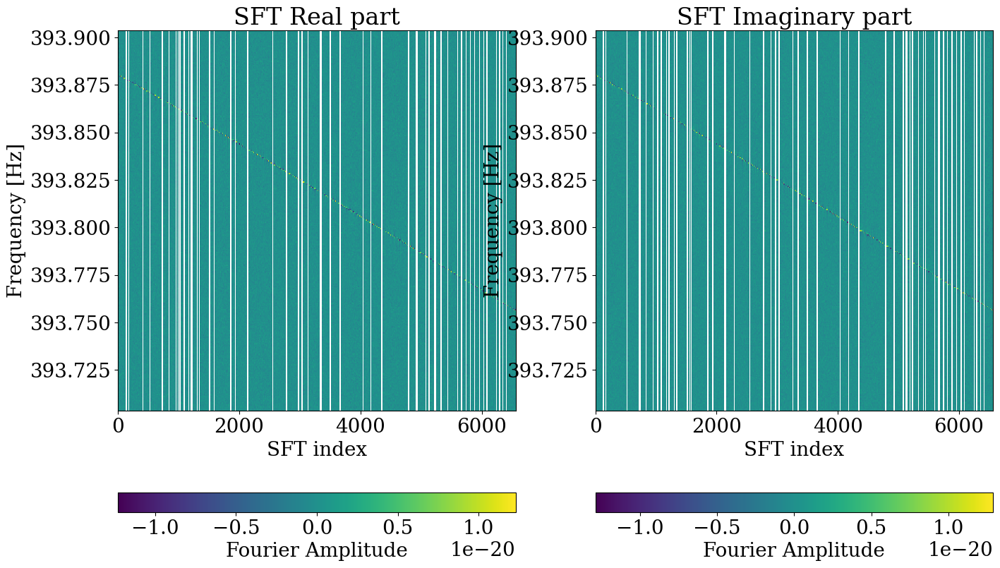

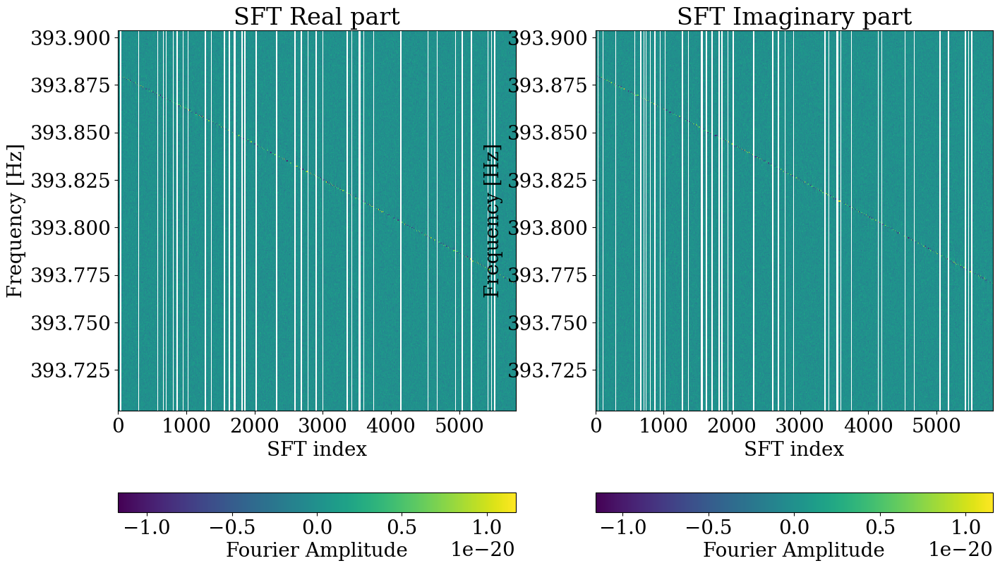

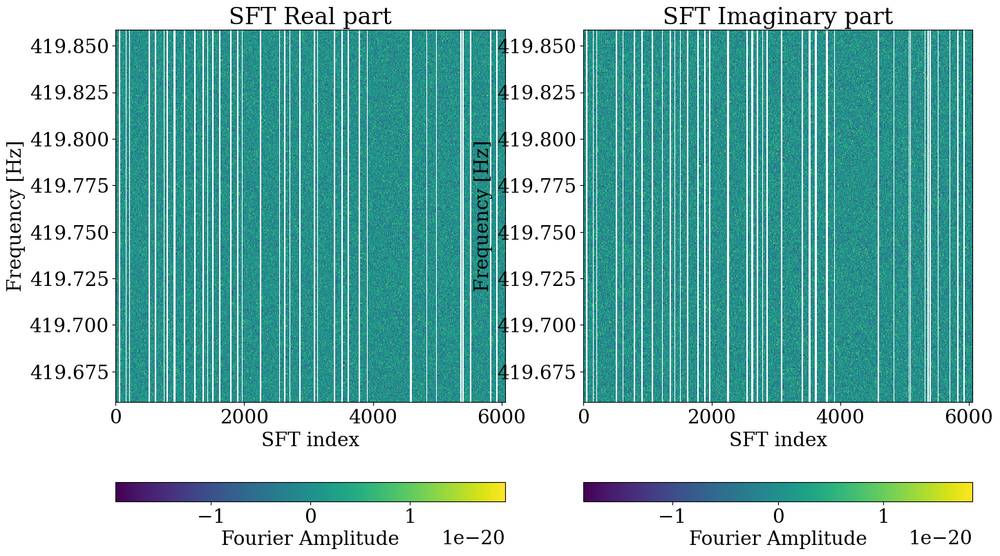

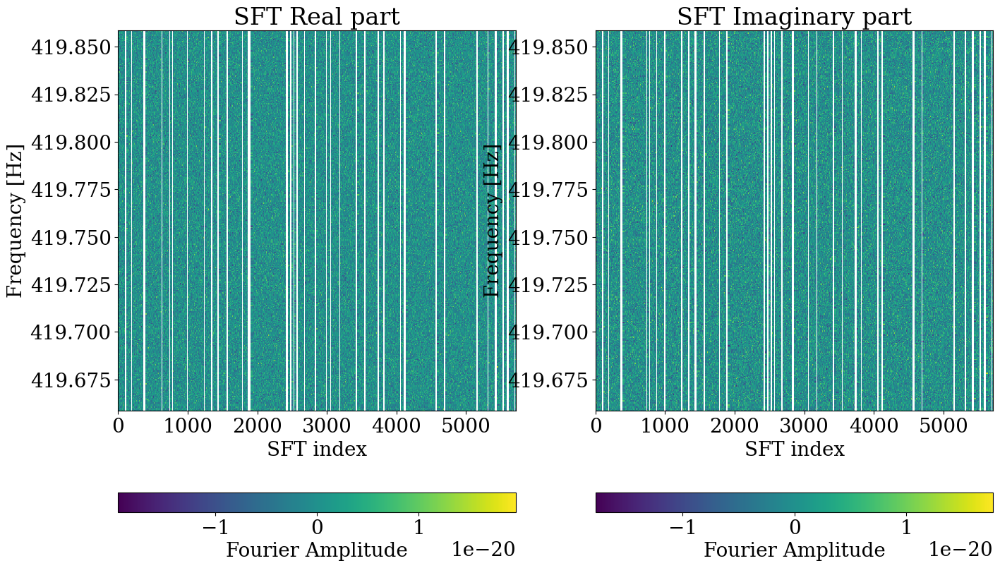

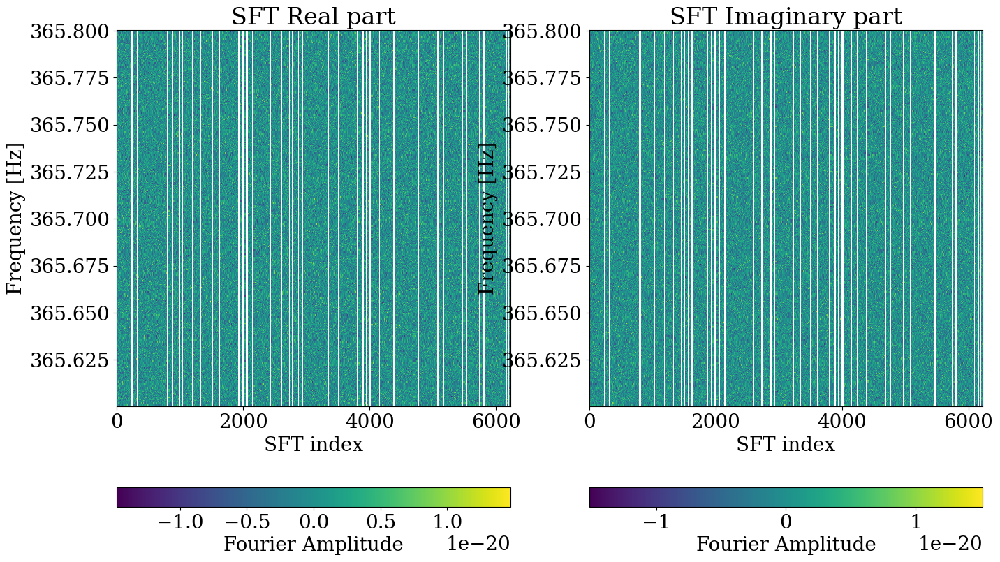

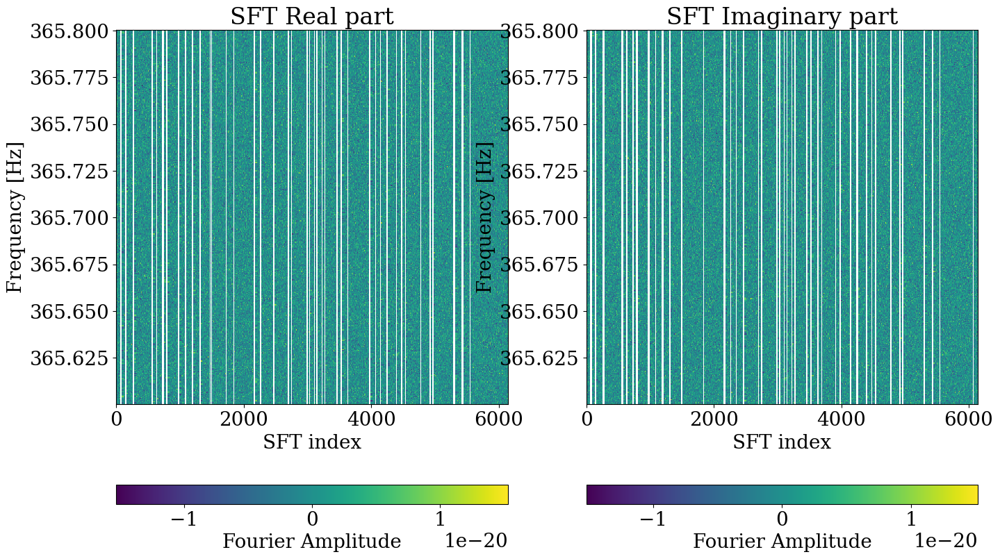

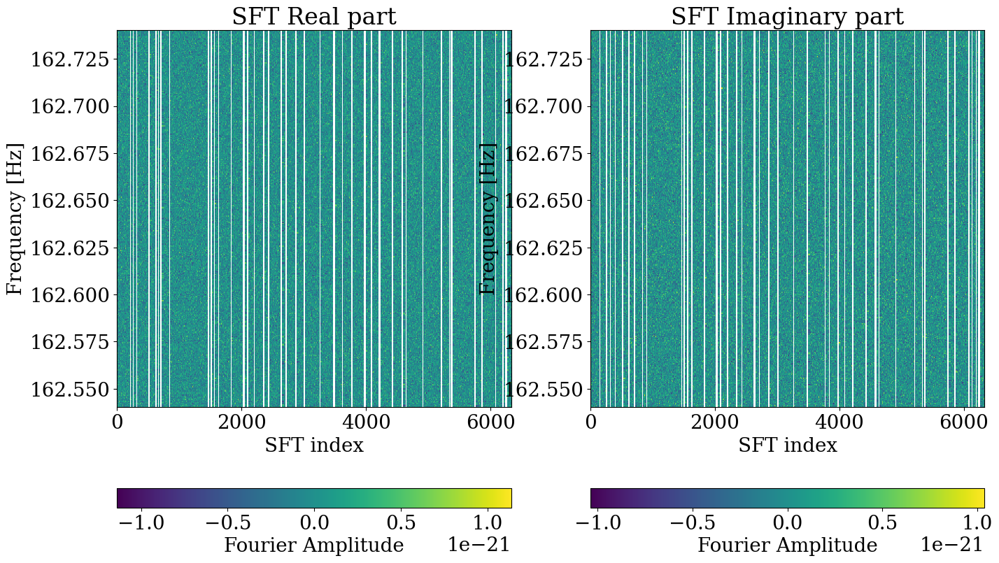

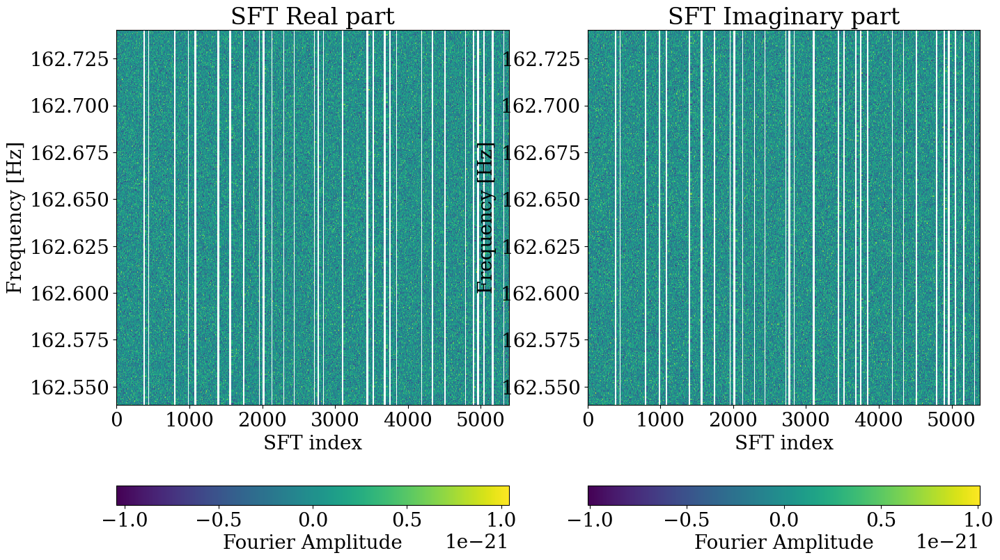

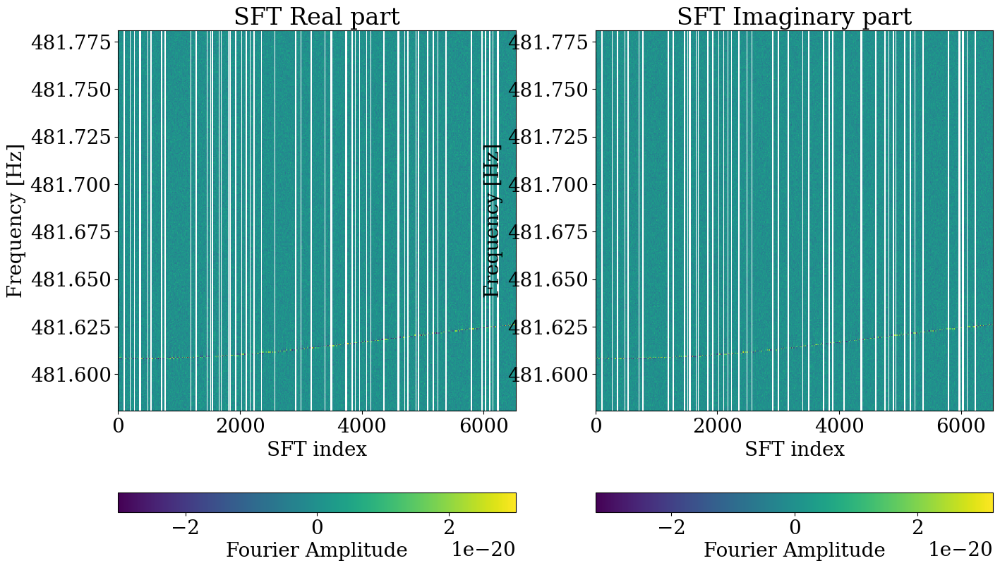

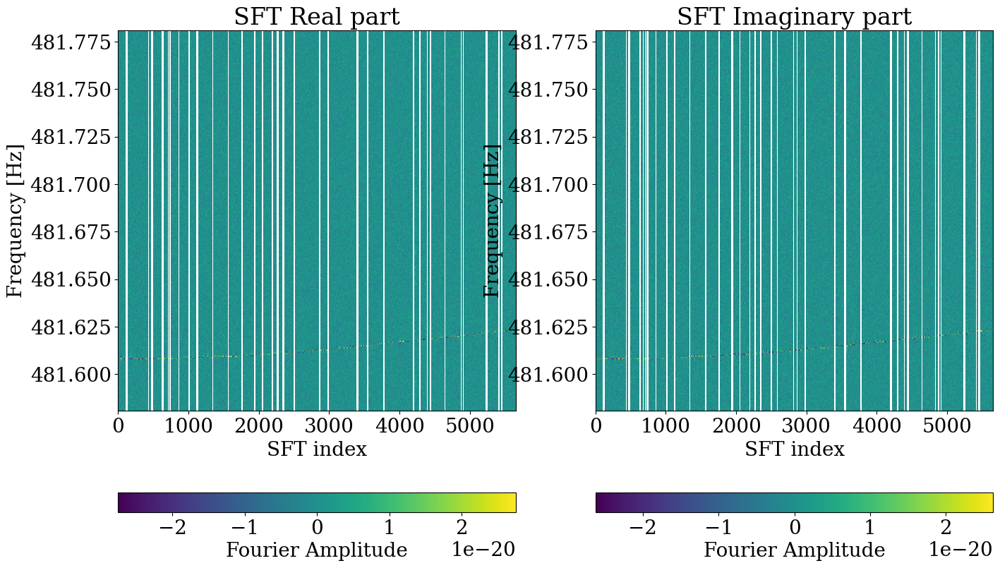

In [18]:
os.makedirs(f"{OUTDIR}/spec_image_sample", exist_ok=True)

h_paths = sorted(glob.glob(f"{OUTDIR}/*_gap.hdf5"))[:5]
for ii, h_path in enumerate(h_paths):
    file_id = Path(h_path).stem

    freq, h1_a, l1_a, h1_t, l1_t = load_hdf5(h_path)
    print(freq.shape)
    print(h1_a.shape, l1_a.shape)
    print(h1_t.shape, l1_t.shape)

    h1_ts_gaps = h1_t[1:] - h1_t[:-1] - 1800
    print("h1 sum gap:",  round(sum(h1_ts_gaps) / (24*3600), 2) , "days")
    #print(list(h1_ts_gaps))

    l1_ts_gaps = l1_t[1:] - l1_t[:-1] - 1800
    print("l1 sum gap:",  round(sum(l1_ts_gaps) / (24*3600), 2) , "days")
    #print(list(l1_ts_gaps))

    #fig_h1, axs = tutorial_utils.plot_real_imag_spectrograms(h1_t, freq, h1_a)
    #fig_l1, axs = tutorial_utils.plot_real_imag_spectrograms(l1_t, freq, l1_a)
    fig_gap_h1, axs = tutorial_utils.plot_real_imag_spectrograms_with_gaps(h1_t, freq, h1_a, 1800)
    fig_gap_l1, axs = tutorial_utils.plot_real_imag_spectrograms_with_gaps(l1_t, freq, l1_a, 1800)
    
    #fig_h1.savefig(f"{OUTDIR}/spec_image_sample/{file_id}_fig_h1.png")
    #fig_l1.savefig(f"{OUTDIR}/spec_image_sample/{file_id}_fig_l1.png")
    fig_gap_h1.savefig(f"{OUTDIR}/spec_image_sample/{file_id}_fig_gap_h1.png")
    fig_gap_l1.savefig(f"{OUTDIR}/spec_image_sample/{file_id}_fig_gap_l1.png")